# Aula 4 - Detecção de Objetos

## Introdução a Detecção de Objetos

A detecção de objetos é uma técnica de visão computacional para localizar instâncias de objetos em imagens ou vídeos. Os algoritmos de detecção de objetos normalmente aproveitam o aprendizado de máquina ou o aprendizado profundo para produzir resultados significativos. Quando os humanos olham para imagens ou vídeos, podemos reconhecer e localizar objetos de interesse em questão de momentos. O objetivo da detecção de objetos é replicar essa inteligência usando um computador.

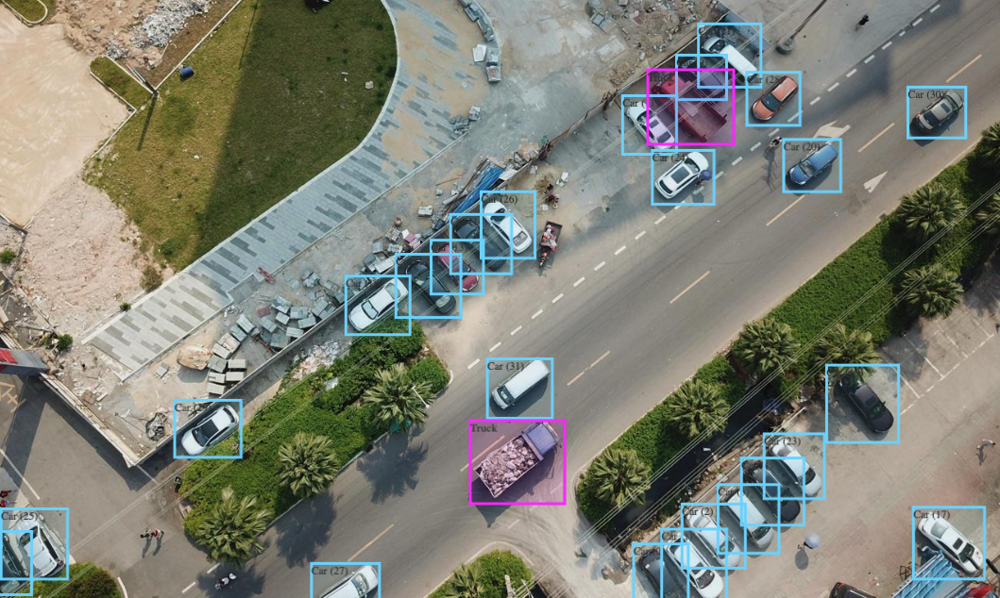

## Classificação de Imagens X Detecção de Objetos

A detecção de objetos é comumente confundida com o reconhecimento de imagem, portanto, antes de prosseguirmos, é importante esclarecer as distinções entre eles.

O reconhecimento de imagem atribui um rótulo a uma imagem. A foto de um cachorro recebe o rótulo de “cachorro”. Uma foto de dois cachorros, ainda recebe o rótulo de “cachorro”. A detecção de objetos, por outro lado, desenha uma caixa ao redor de cada cachorro e rotula a caixa como “cachorro”. O modelo prevê onde cada objeto está e qual rótulo deve ser aplicado. Dessa forma, a detecção de objetos fornece mais informações sobre uma imagem do que o reconhecimento.

Aqui está um exemplo de como essa distinção se parece na prática:

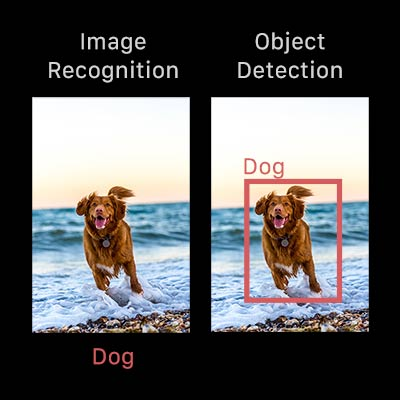

## Estrutura básica

A detecção de objetos localiza a presença de um objeto em uma imagem e desenha uma caixa delimitadora em torno desse objeto. Isso geralmente envolve dois processos; classificando e tipo de objeto e, em seguida, desenhando uma caixa em torno desse objeto. Já cobrimos a classificação de imagens antes, então vamos agora revisar algumas das arquiteturas de modelo comuns usadas para detecção de objetos:

- R-CNN
- Fast R-CNN
- Faster R-CNN
- SSD (Single Shot MultiBox Defender)
- YOLO (You Only Look Once)

## Tipos de arquiteturas

Se você criar um detector de objetos personalizado ou usar um pré-treinado, precisará decidir que tipo de rede de detecção de objetos deseja usar: uma rede de Two Stage ou uma rede de Single Shot.

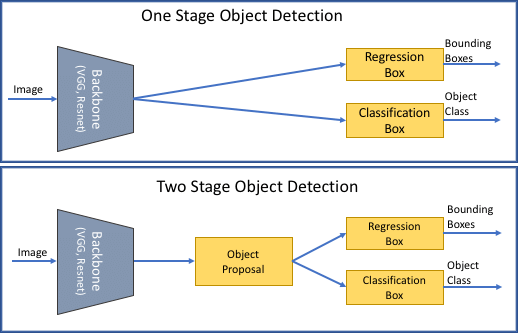

Two-Stage Networks

O estágio inicial de redes de dois estágios, como R-CNN e suas variantes, identifica propostas de regiões ou subconjuntos da imagem que podem conter um objeto. A segunda etapa classifica os objetos dentro das regiões propostas. Redes de dois estágios podem alcançar resultados de detecção de objetos muito precisos; no entanto, elas são tipicamente mais lentas do que as redes de estágio único.

Single-Stage Networks

Em redes de estágio único, como YOLO v2, a CNN produz previsões de rede para regiões em toda a imagem usando caixas de âncora, e as previsões são decodificadas para gerar as caixas delimitadoras finais para os objetos. As redes de estágio único podem ser muito mais rápidas do que as redes de dois estágios, mas podem não atingir o mesmo nível de precisão, especialmente para cenas que contêm objetos pequenos.

## Família YOLO

Em 2015, uma família de redes neurais foi proposta com a abreviatura YOLO em referência à notável frase “You only live once”. Isso se baseia no simples fato de que a rede só dá “uma olhada” ou uma passagem pela rede antes de produzir a imagem final. Isso permite a detecção de objetos com imagens em tempo real, o que é consideravelmente preferível para aplicativos relacionados à vigilância. A precisão dos objetos detectados é menor do que os modelos mencionados anteriormente devido à sua velocidade excepcional, mas mesmo assim consegue ser um concorrente de topo entre os demais.

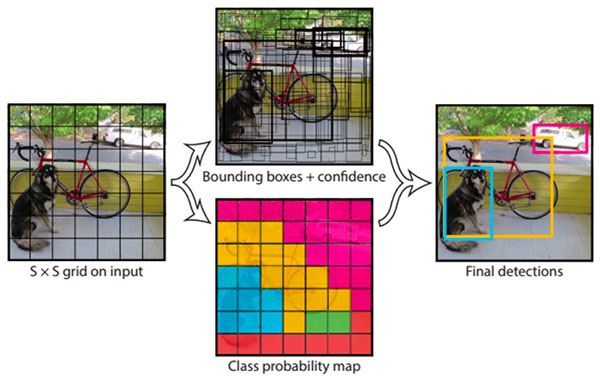

O algoritmo YOLO funciona dividindo a imagem em N grades, cada uma com uma região dimensional igual de SxS. Cada uma dessas N grades é responsável pela detecção e localização do objeto que contém.

Correspondentemente, essas grades prevêem as coordenadas da caixa delimitadora B em relação às suas coordenadas de célula, juntamente com o rótulo do objeto e a probabilidade do objeto estar presente na célula.

Esse processo reduz bastante a computação, pois tanto a detecção quanto o reconhecimento são manipulados por células da imagem. Ele traz muitas previsões duplicadas devido a várias células que prevêem o mesmo objeto com diferentes previsões de caixa delimitadora.

YOLO faz uso de supressão não máxima para lidar com esse problema.

Na supressão não máxima, o YOLO suprime todas as caixas delimitadoras que têm pontuações de probabilidade mais baixas.

O YOLO consegue isso primeiro olhando para as pontuações de probabilidade associadas a cada decisão e tomando a maior delas. Em seguida, ele suprime as caixas delimitadoras com a maior interseção sobre a união com a caixa delimitadora de alta probabilidade atual.

Este passo é repetido até que as caixas delimitadoras finais sejam obtidas.

## YOLOv8

YOLOv8 é o mais novo modelo YOLO de última geração que pode ser usado para tarefas de detecção de objetos, classificação de imagens e segmentação de instâncias. O YOLOv8 foi desenvolvido pela Ultralytics, que também criou o modelo YOLOv5 influente e definidor do setor. O YOLOv8 inclui inúmeras mudanças e melhorias na arquitetura e na experiência do desenvolvedor em relação ao YOLOv5.

### Versões

YOLOv8 oferece vários tamanhos de modelo para atender a diferentes cenários de implantação. Esses modelos incluem YOLOv8n, YOLOv8s, YOLOv8m, YOLOv8l e YOLOv8x. Por exemplo, se o modelo estiver sendo implantado em dispositivos de ponta, o YOLOv8n poderá ser escolhido.

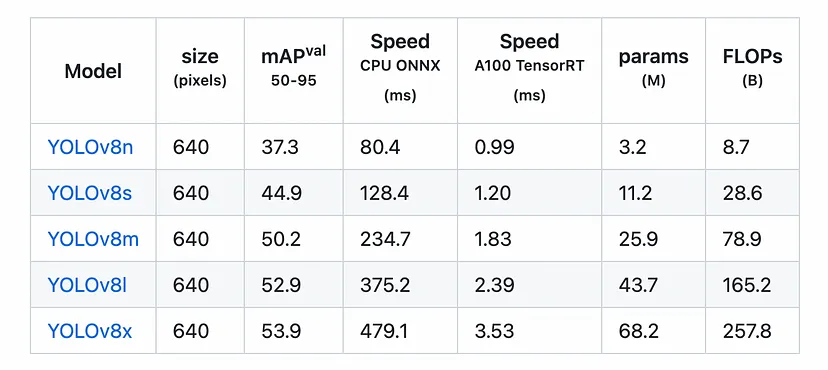

### Arquitetura e design de rede YOLOv8

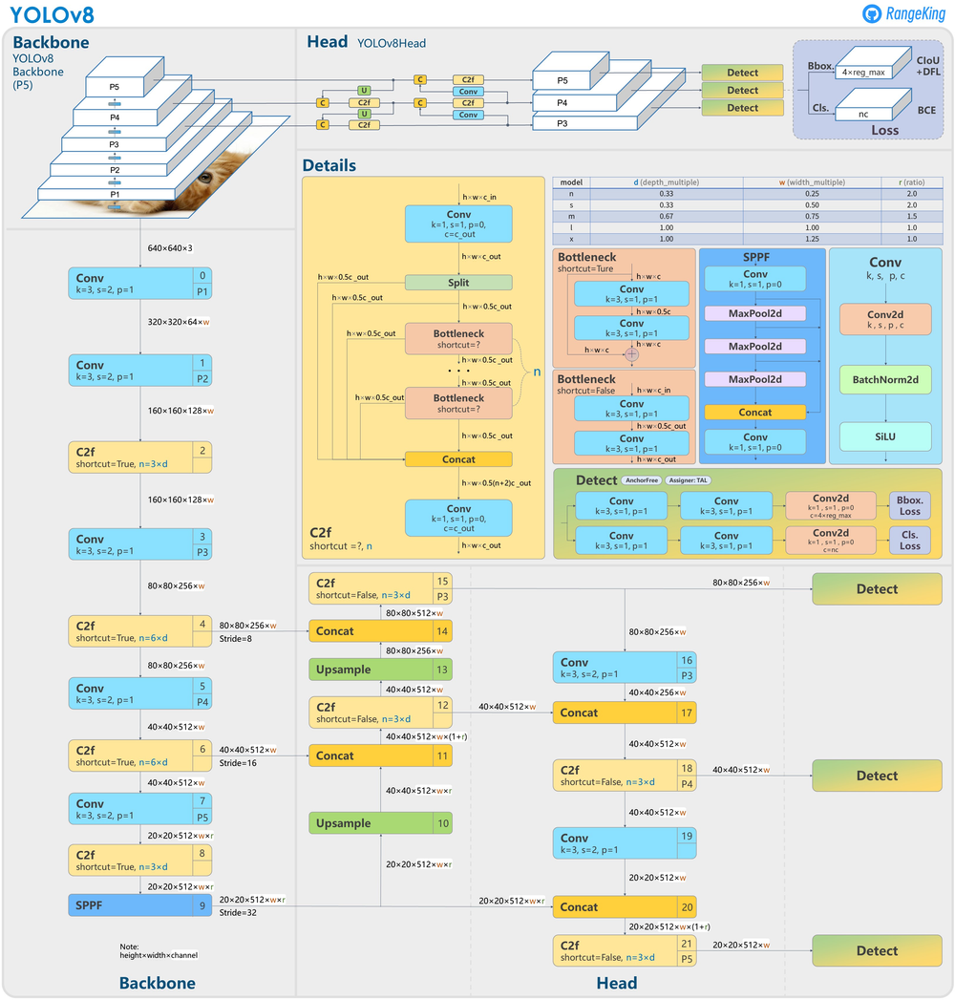

## Caixas delimitadoras orientadas Detecção de objetos

A detecção orientada de objetos vai um passo mais além do que a detecção de objetos e introduz um ângulo extra para localizar objetos com maior precisão numa imagem.

O resultado de um detector de objetos orientado é um conjunto de caixas delimitadoras rodadas que envolvem exatamente os objetos na imagem, juntamente com etiquetas de classe e pontuações de confiança para cada caixa. A detecção de objetos é uma boa escolha quando é necessário identificar objetos de interesse numa cena, mas não é necessário saber exatamente onde se encontra o objeto ou a sua forma exacta.

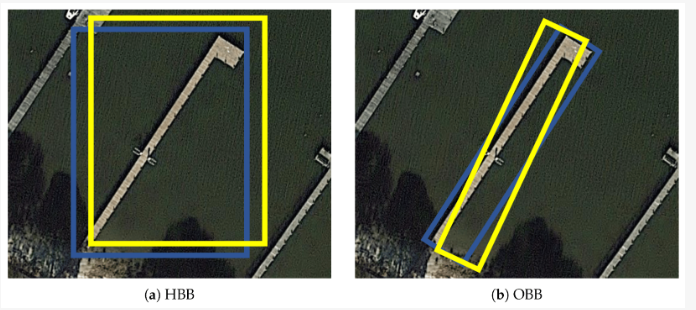

Link para acessar o dataset: https://drive.google.com/drive/folders/1kFjhy3bj_k1wQ7y8OzzGIUVUNTPo_UdV?usp=sharing

Começamos instalando as bibliotecas necessárias:

In [ ]:
!pip install rasterio
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 51.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 18.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 114.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 81.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 66.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 43.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 19.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 102.0 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu1

Agora, vamos realizar a conexão com o Drive e importando funções que vamos usar:

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import rasterio
import geopandas as gpd
import numpy as np
from matplotlib import pyplot as plt
import cv2
from rasterio.features import rasterize
from rasterio.windows import Window
from rasterio.plot import show
import os
from shapely.geometry import box
from shapely.ops import unary_union
import json
from shapely.geometry import shape
from shapely.geometry import Polygon
from shapely.geometry import MultiPolygon
from shapely.ops import unary_union
import shapely
import math
import pandas as pd
from skimage import io
from skimage.io import imsave
from sklearn import model_selection
import os
import shutil
import json
import ast
import numpy as np
from tqdm import tqdm
import pandas as  pd
import seaborn as sns
import fastai.vision as vision
import xml.etree.ElementTree as ET
import glob
from shapely.geometry import Polygon

O próximo passo é setar o caminho da imagem, abrir-la com o rasterio e plotar:

In [ ]:
path_img = '/content/drive/MyDrive/Datasets/TL_UAV_Mosaic/Lagoa1.tif'

In [ ]:
src_img = rasterio.open(path_img)

In [ ]:
img = src_img.read()

In [ ]:
img.shape

(4, 24885, 27011)

In [ ]:
img = img.transpose([1,2,0])

(np.float64(-0.5), np.float64(27010.5), np.float64(24884.5), np.float64(-0.5))

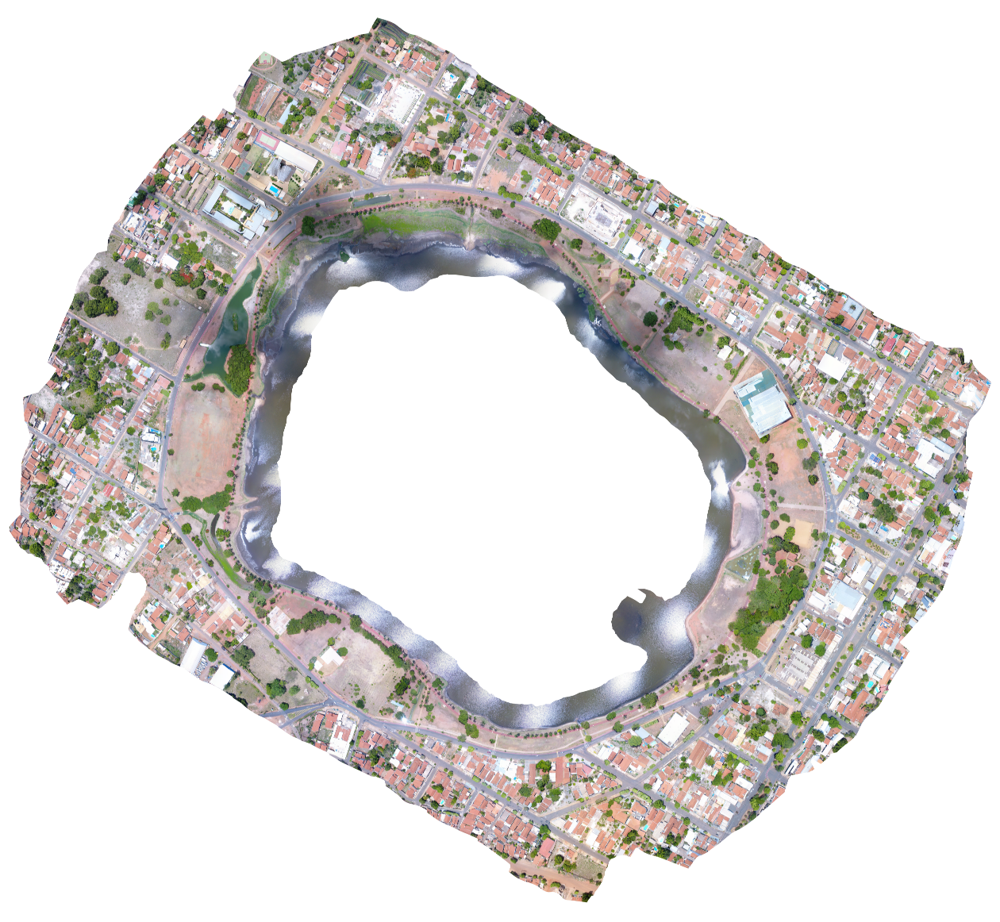

In [ ]:
plt.figure(figsize=[16,16])
plt.imshow(img)
plt.axis('off')

Vamos dividir a imagem em vários pathches de imagens com um tamanho de 1024 x 1024:

In [ ]:
if not os.path.isdir('/content/Predict'):
    os.mkdir('/content/Predict')

In [ ]:
qtd = 0
out_meta = src_img.meta.copy()
for n in range((src_img.meta['width']//1024)):
  for m in range((src_img.meta['height']//1024)):
    x = (n*1024)
    y = (m*1024)
    window = Window(x,y,1024,1024)
    win_transform = src_img.window_transform(window)
    arr_win = src_img.read(window=window)
    arr_win = arr_win[0:3,:,:]
    if (arr_win.max() != 0) and (arr_win.shape[1] == 1024) and (arr_win.shape[2] == 1024):
      qtd = qtd + 1
      path_exp = '/content/Predict/img_' + str(qtd) + '.tif'
      out_meta.update({"driver": "GTiff","height": 1024,"width": 1024, "transform":win_transform})
      with rasterio.open(path_exp, 'w', **out_meta) as dst:
          for i, layer in enumerate(arr_win, start=1):
              dst.write_band(i, layer.reshape(-1, layer.shape[-1]))
      del arr_win

In [ ]:
print(qtd)

624


Depois convertemos a imagem tiff para jpg:

In [ ]:
if not os.path.isdir('/content/Predict_jpg'):
    os.mkdir('/content/Predict_jpg')

path_data_pred = '/content/Predict_jpg'
imgs_to_pred = os.listdir('/content/Predict')
for images in imgs_to_pred:
  src = rasterio.open('/content/Predict/' + images)
  raster = src.read()
  raster = raster.transpose([1,2,0])
  raster = raster[:,:,0:3]
  imsave(os.path.join(path_data_pred,images.split('.')[0] + '.jpg'), raster)

/usr/local/lib/python3.11/dist-packages/skimage/_shared/utils.py:328: UserWarning: /content/Predict_jpg/img_597.jpg is a low contrast image
  return func(*args, **kwargs)
/usr/local/lib/python3.11/dist-packages/skimage/_shared/utils.py:328: UserWarning: /content/Predict_jpg/img_560.jpg is a low contrast image
  return func(*args, **kwargs)
/usr/local/lib/python3.11/dist-packages/skimage/_shared/utils.py:328: UserWarning: /content/Predict_jpg/img_16.jpg is a low contrast image
  return func(*args, **kwargs)
/usr/local/lib/python3.11/dist-packages/skimage/_shared/utils.py:328: UserWarning: /content/Predict_jpg/img_278.jpg is a low contrast image
  return func(*args, **kwargs)
/usr/local/lib/python3.11/dist-packages/skimage/_shared/utils.py:328: UserWarning: /content/Predict_jpg/img_461.jpg is a low contrast image
  return func(*args, **kwargs)
/usr/local/lib/python3.11/dist-packages/skimage/_shared/utils.py:328: UserWarning: /content/Predict_jpg/img_69.jpg is a low contrast image
  retur

YOLOv8 modelos OBB pré-treinados são mostrados aqui, que são pré-treinados no conjunto de dados DOTAv1.

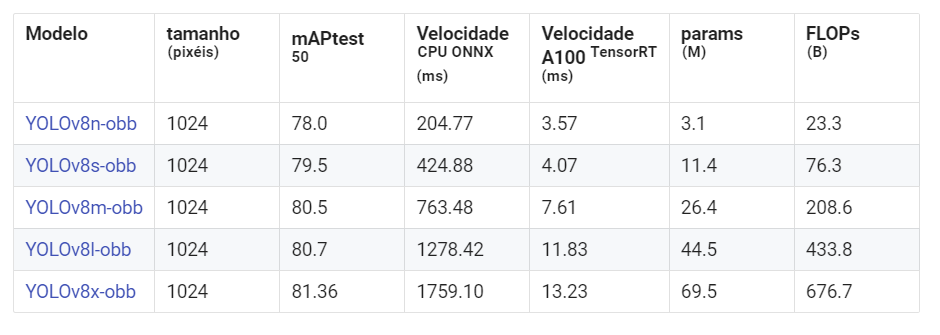

Vamos importar a YOLO e usar os pesos pré-treinados da YOLOv8 OBB:

In [ ]:
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
model = YOLO('/content/drive/MyDrive/Datasets/TL_UAV_Mosaic/yolov8x-obb.pt')

In [ ]:
model.predict('/content/Predict_jpg', save=True,save_txt=True, show_conf=False, show_labels=False, imgsz=1024, conf=0.4)


image 1/624 /content/Predict_jpg/img_1.jpg: 1024x1024 (no detections), 136.8ms
image 2/624 /content/Predict_jpg/img_10.jpg: 1024x1024 (no detections), 123.0ms
image 3/624 /content/Predict_jpg/img_100.jpg: 1024x1024 (no detections), 130.1ms
image 4/624 /content/Predict_jpg/img_101.jpg: 1024x1024 (no detections), 130.7ms
image 5/624 /content/Predict_jpg/img_102.jpg: 1024x1024 None131.9ms
image 6/624 /content/Predict_jpg/img_103.jpg: 1024x1024 None128.9ms
image 7/624 /content/Predict_jpg/img_104.jpg: 1024x1024 (no detections), 133.3ms
image 8/624 /content/Predict_jpg/img_105.jpg: 1024x1024 (no detections), 131.6ms
image 9/624 /content/Predict_jpg/img_106.jpg: 1024x1024 (no detections), 132.2ms
image 10/624 /content/Predict_jpg/img_107.jpg: 1024x1024 (no detections), 133.2ms
image 11/624 /content/Predict_jpg/img_108.jpg: 1024x1024 None134.4ms
image 12/624 /content/Predict_jpg/img_109.jpg: 1024x1024 (no detections), 131.6ms
image 13/624 /content/Predict_jpg/img_11.jpg: 1024x1024 (no detect

[ultralytics.engine.results.Results object with attributes:
 
 boxes: None
 keypoints: None
 masks: None
 names: {0: 'plane', 1: 'ship', 2: 'storage tank', 3: 'baseball diamond', 4: 'tennis court', 5: 'basketball court', 6: 'ground track field', 7: 'harbor', 8: 'bridge', 9: 'large vehicle', 10: 'small vehicle', 11: 'helicopter', 12: 'roundabout', 13: 'soccer ball field', 14: 'swimming pool'}
 obb: ultralytics.engine.results.OBB object
 orig_img: array([[[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        ...,
 
        [[255, 25

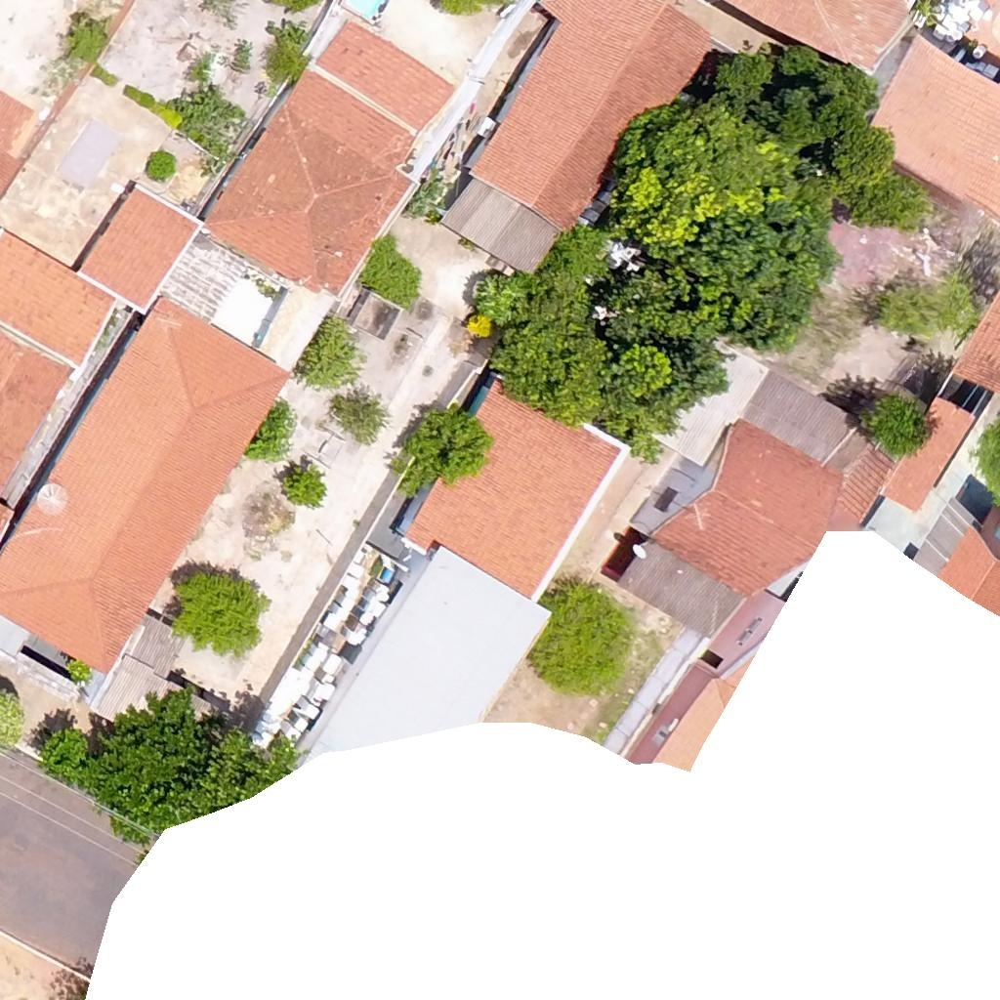

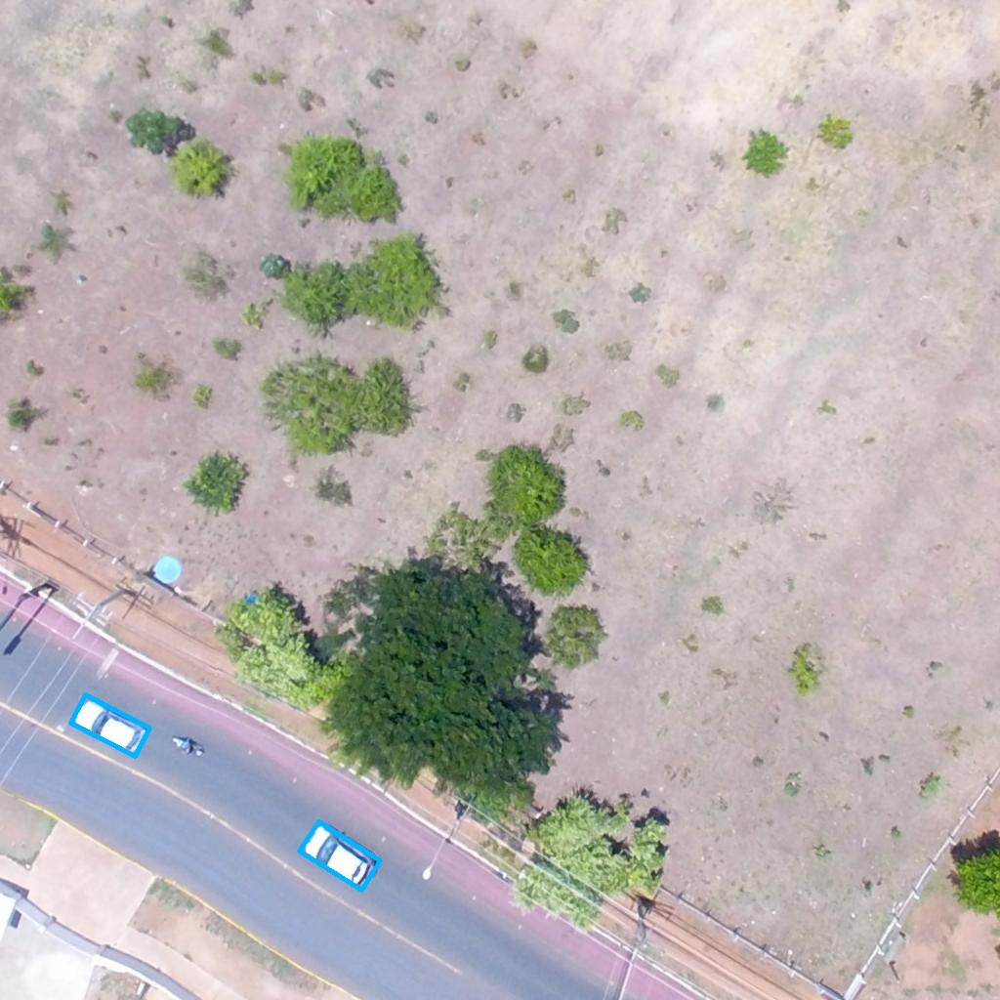

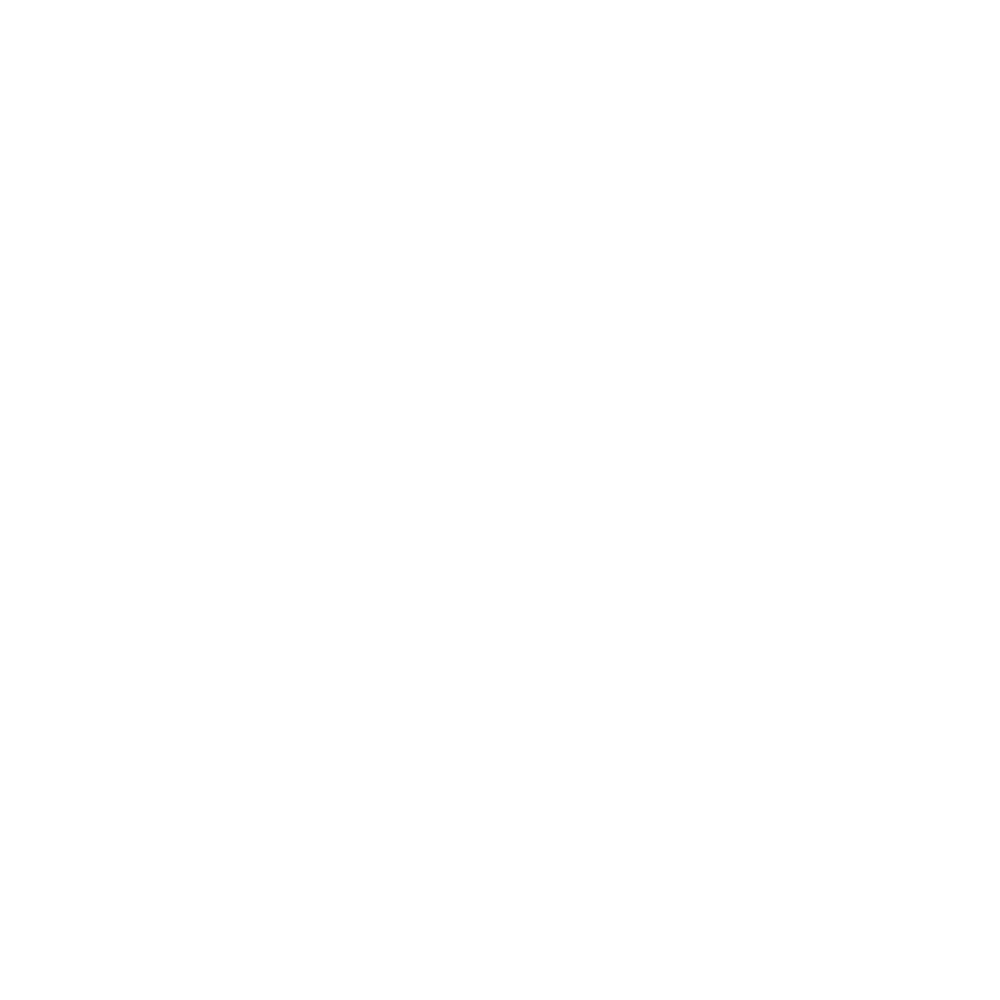

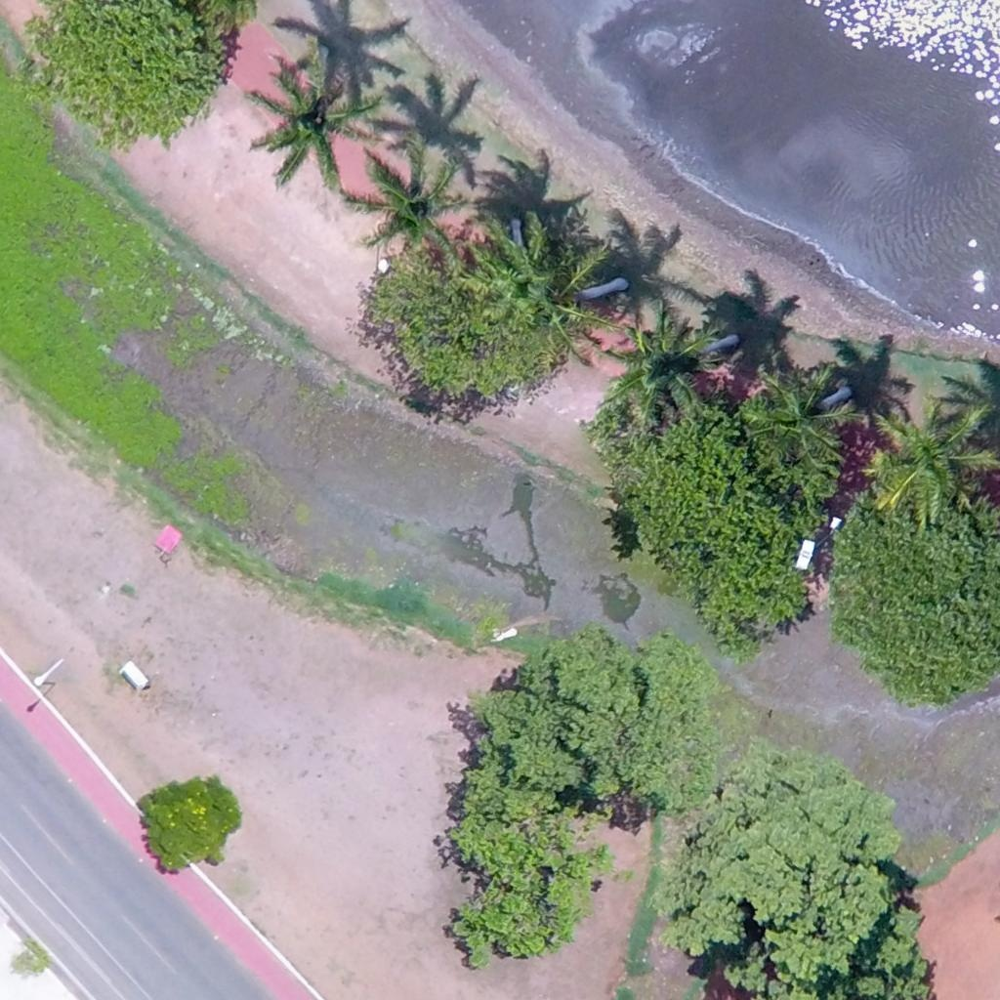

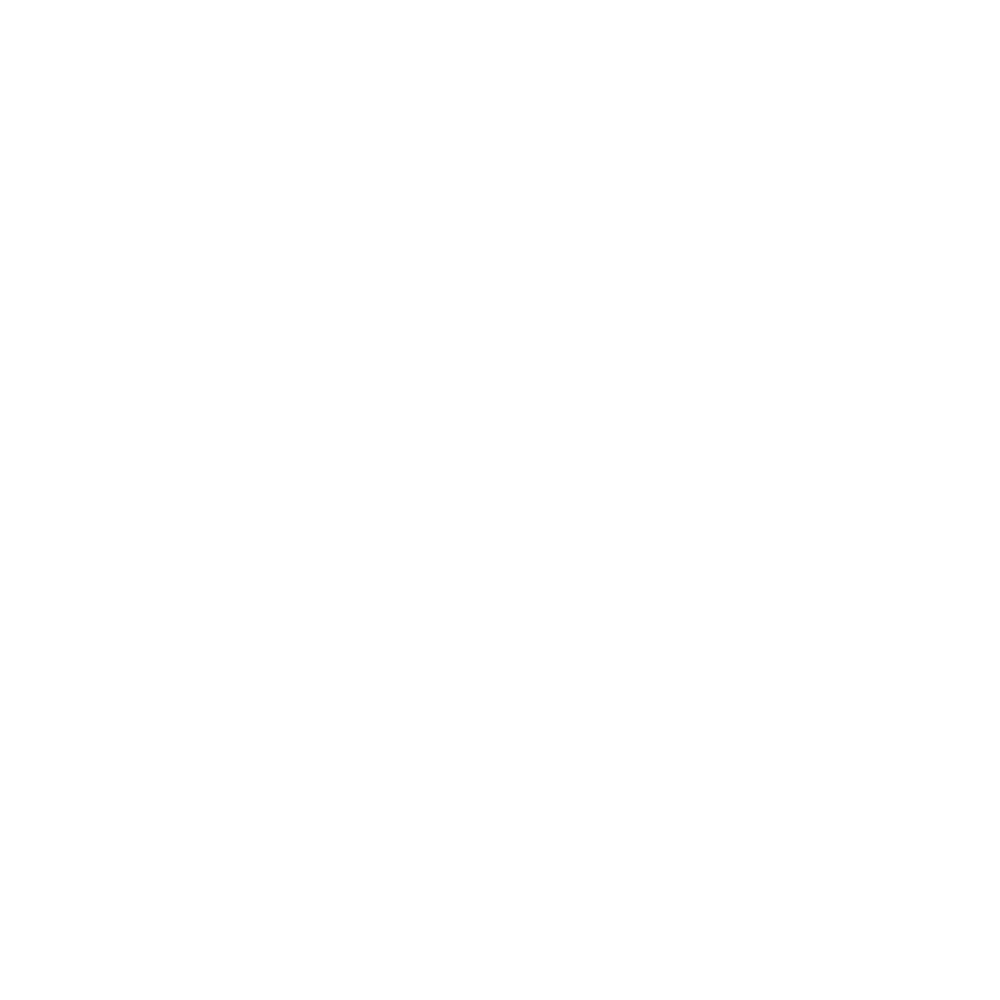

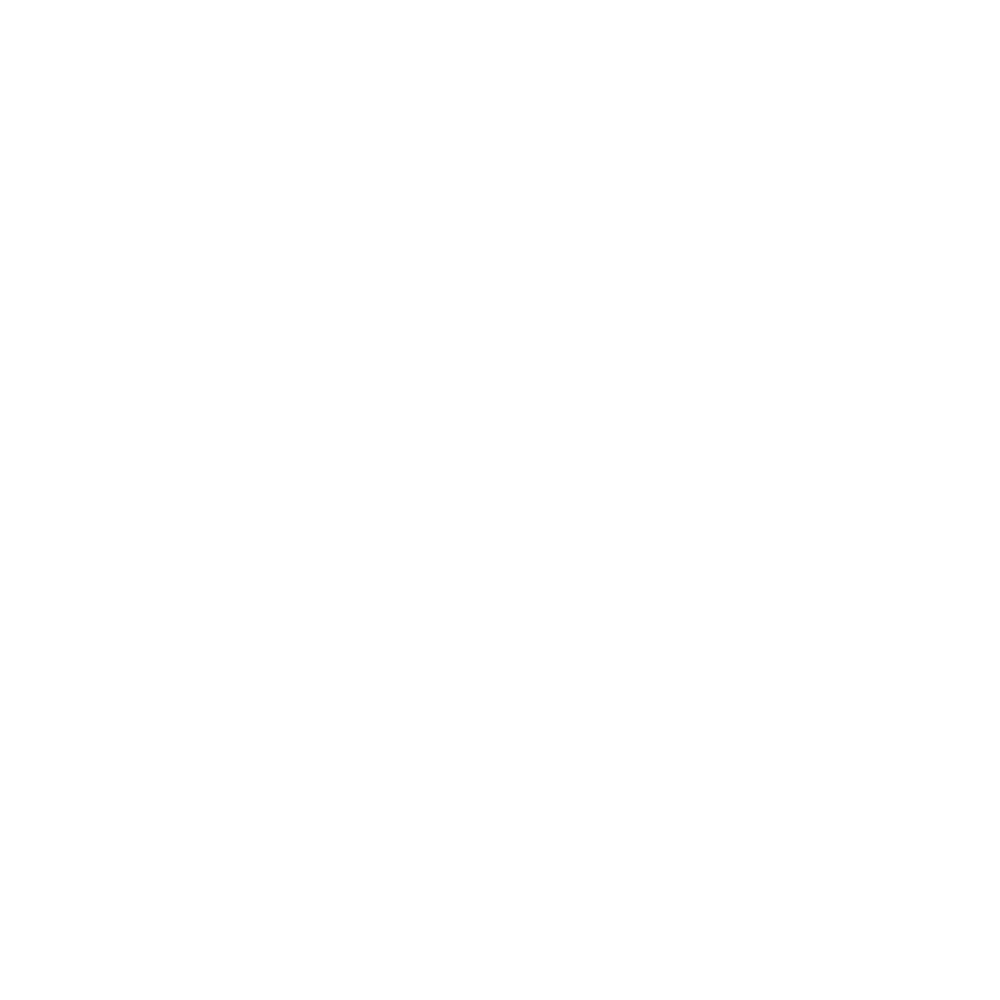

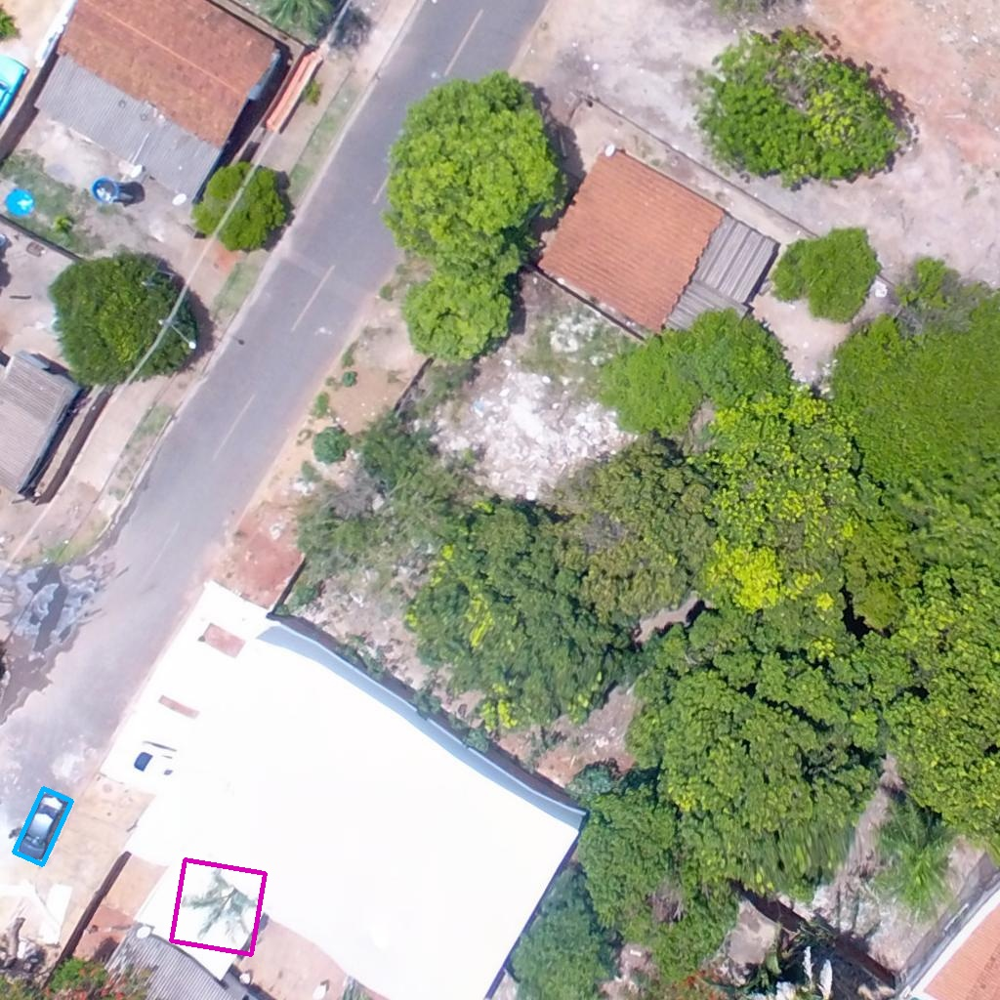

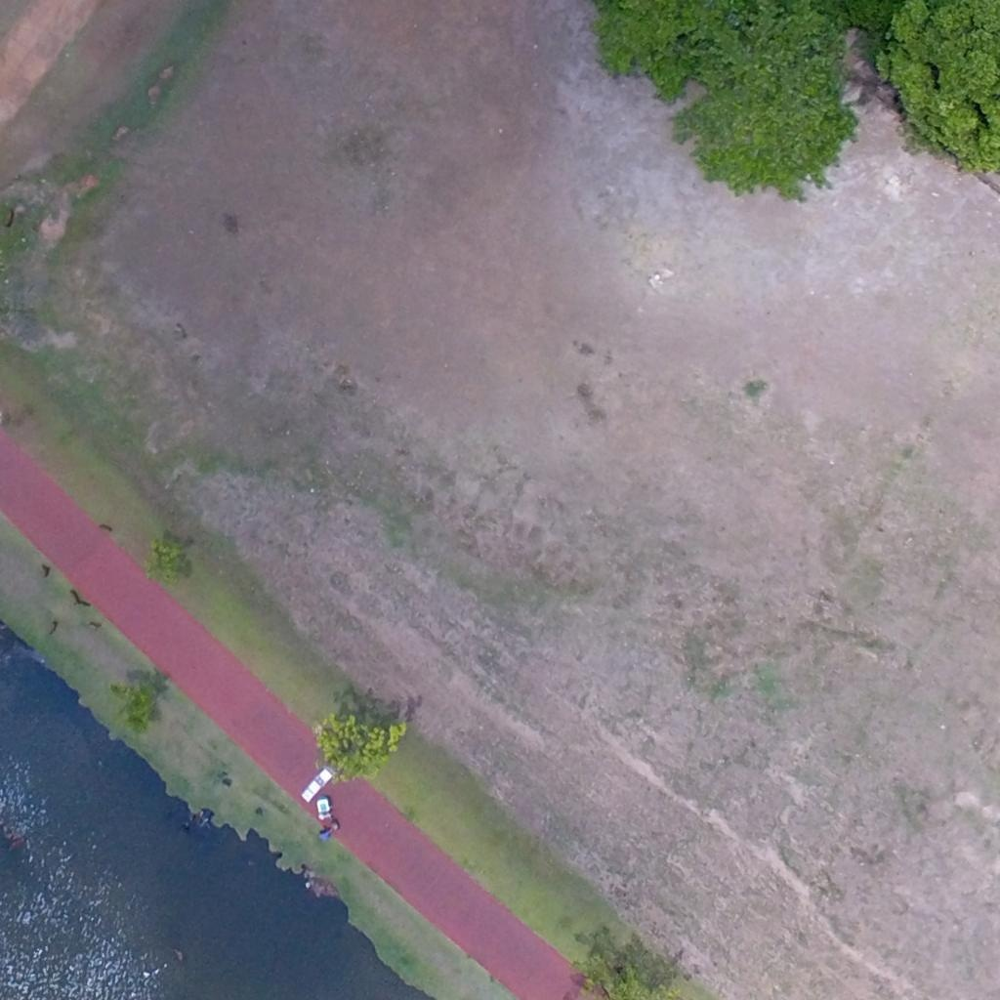

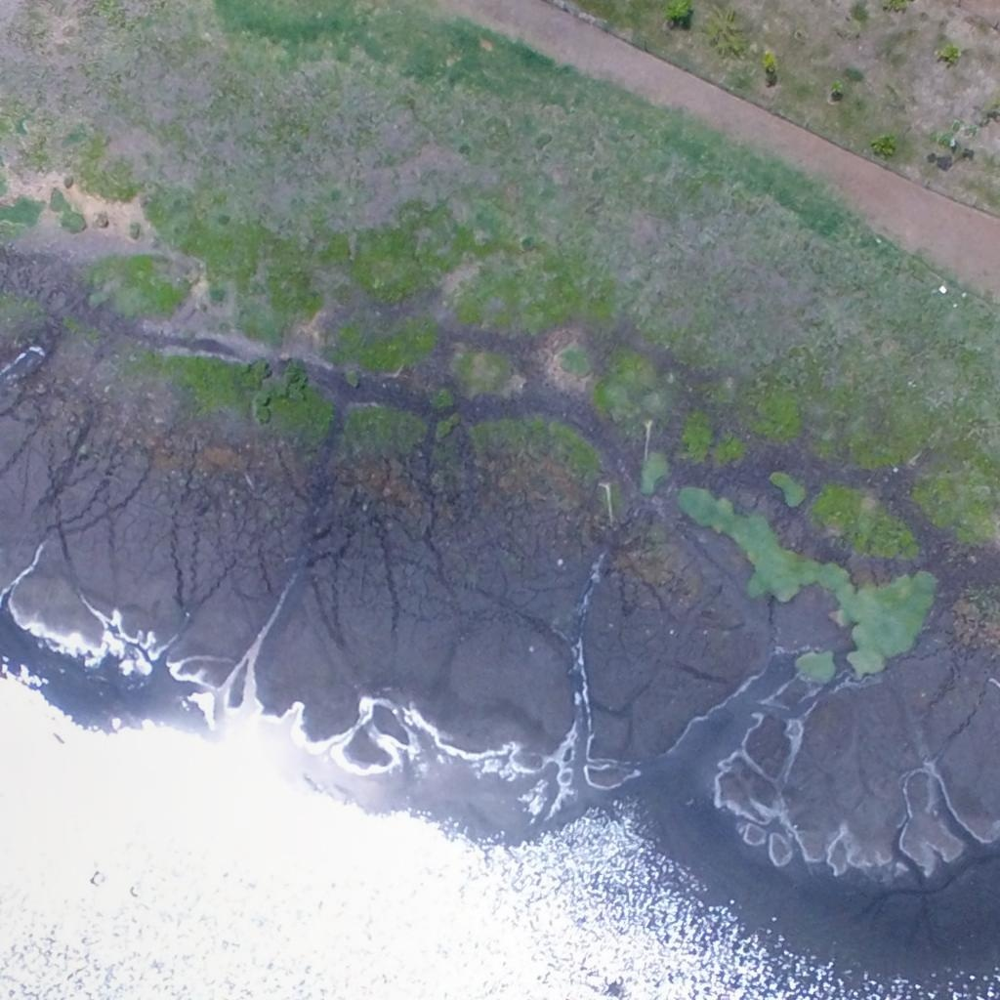

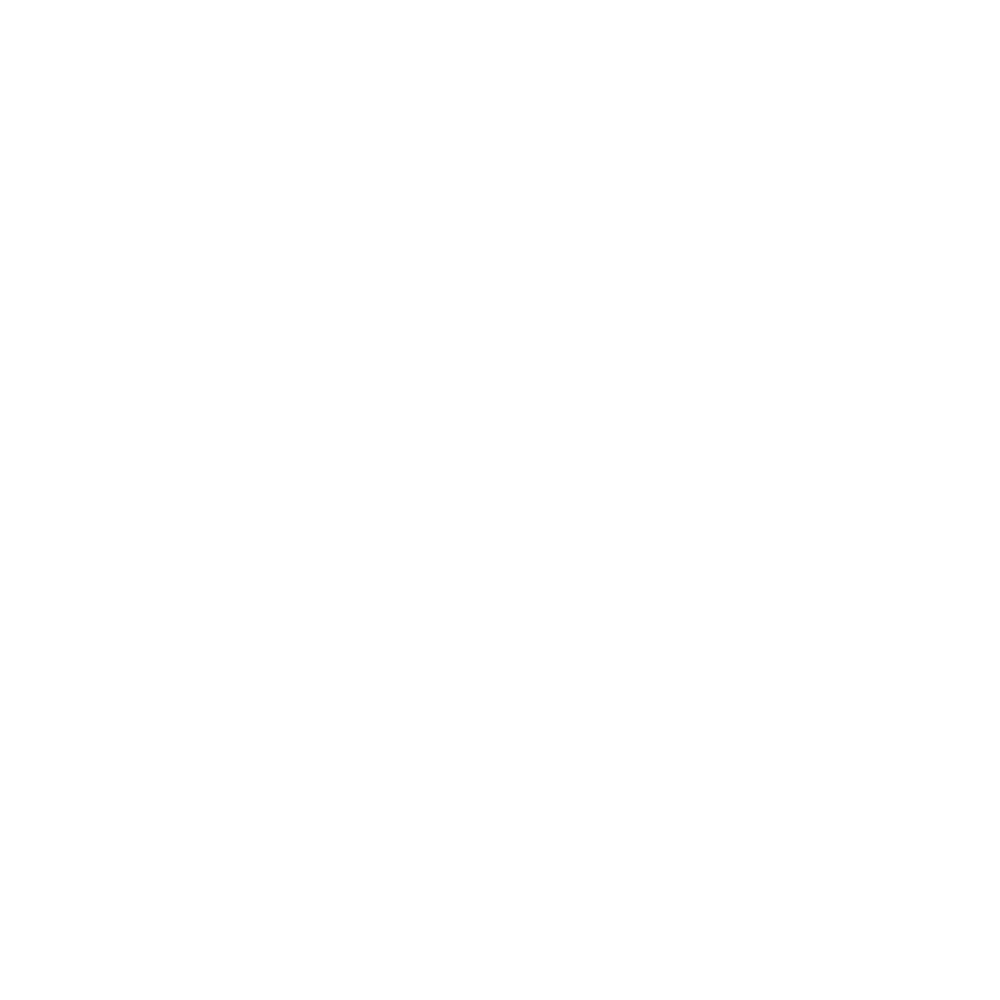

In [ ]:
from IPython.display import Image, display
for images in glob.glob('/content/runs/obb/predict/*.jpg')[250:260]:
    display(Image(filename=images))

Com os resultados gerados, vamos obter as coordenadas das caixas delimitadoras e converter em um poligono com coordendas geográficas:

In [ ]:
ls_poly = []
ls_class = []
imgs_to_pred = [f for f in os.listdir('/content/runs/obb/predict/labels/') if f.endswith('.txt')]
for images in imgs_to_pred:
  filename = images.split('.')[0]
  src = rasterio.open('/content/Predict/' + filename + '.tif')
  path = f'/content/runs/obb/predict/labels/'+filename+'.txt'
  cols = ['class', 'x1', 'y1', 'x2', 'y2', 'x3', 'y3', 'x4', 'y4']
  df = pd.read_csv(path, sep=" ", header=None)
  df.columns = cols
  df['x1'] = np.round(df['x1'] * 1024)
  df['y1'] = np.round(df['y1'] * 1024)
  df['x2'] = np.round(df['x2'] * 1024)
  df['y2'] = np.round(df['y2'] * 1024)
  df['x3'] = np.round(df['x3'] * 1024)
  df['y3'] = np.round(df['y3'] * 1024)
  df['x4'] = np.round(df['x4'] * 1024)
  df['y4'] = np.round(df['y4'] * 1024)

  for i,row in df.iterrows():
    xs1, ys1 = rasterio.transform.xy(src.transform, row['y1'], row['x1'])
    xs2, ys2 = rasterio.transform.xy(src.transform, row['y2'], row['x2'])
    xs3, ys3 = rasterio.transform.xy(src.transform, row['y3'], row['x3'])
    xs4, ys4 = rasterio.transform.xy(src.transform, row['y4'], row['x4'])

    ls_poly.append(Polygon([[xs1, ys1], [xs2,ys2], [xs3, ys3], [xs4,ys4]]))
    ls_class.append(row['class'])


Então criamos um GeoDataFrame com os poligonos:

In [ ]:
gdf = gpd.GeoDataFrame(ls_class, geometry=ls_poly, crs=src.crs)

In [ ]:
gdf.rename(columns={0:'class'}, inplace=True)

In [ ]:
gdf

,class,geometry
0,10.0,"POLYGON ((-51.71192 -20.78413, -51.71191 -20.7..."
1,10.0,"POLYGON ((-51.71869 -20.77885, -51.71866 -20.7..."
2,9.0,"POLYGON ((-51.71865 -20.77881, -51.71861 -20.7..."
3,10.0,"POLYGON ((-51.71083 -20.78458, -51.71081 -20.7..."
4,10.0,"POLYGON ((-51.71082 -20.78463, -51.7108 -20.78..."
...,...,...
348,10.0,"POLYGON ((-51.72115 -20.77987, -51.72114 -20.7..."
349,10.0,"POLYGON ((-51.72099 -20.77968, -51.72097 -20.7..."
350,14.0,"POLYGON ((-51.7176 -20.78669, -51.71757 -20.78..."
351,7.0,"POLYGON ((-51.71205 -20.78165, -51.71202 -20.7..."


Por fim podemos salvar em um .shp ou .json:

In [ ]:
gdf.to_file('objects.json')

Abrimos o arquivo no QGIS para ver os resultados junto com a imagem:

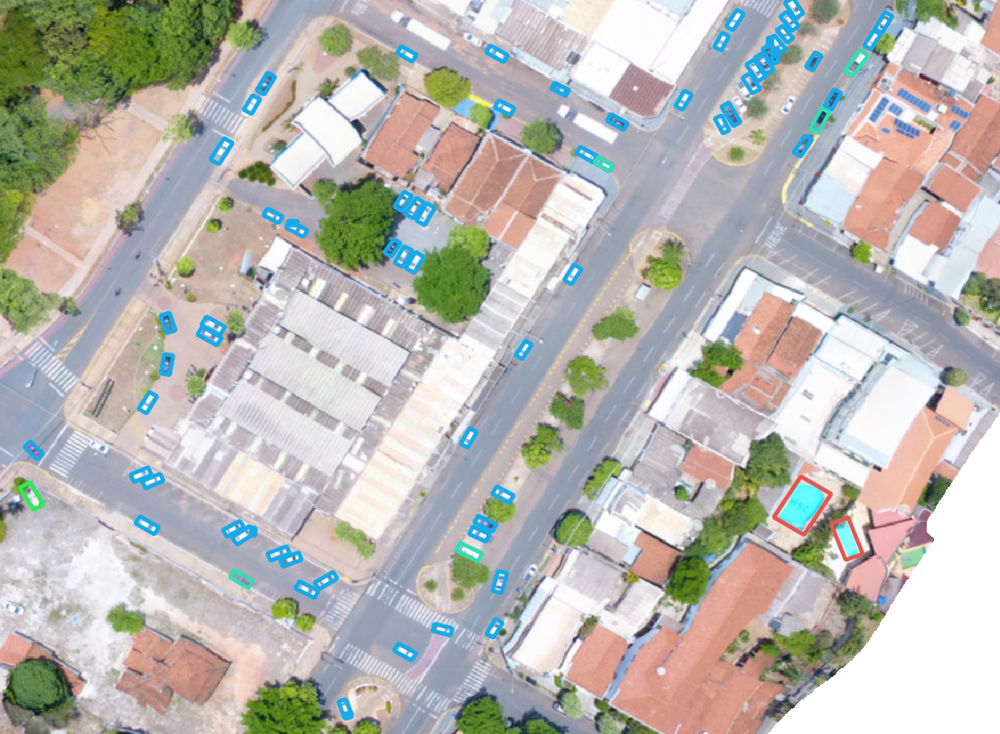